### Importing Essential libraries 

In [211]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing 
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn import tree
from sklearn.metrics import mean_squared_error , mean_absolute_error , explained_variance_score
from sklearn.metrics import classification_report

sns.set_style('whitegrid')
sns.set_context('paper', font_scale=1.0)

%matplotlib inline

# Set options for display
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 100 
pd.options.display.float_format = '{:.2f}'.format

import warnings
warnings.filterwarnings('ignore')


### Loading the Dataset 

In [272]:
# Load the dataset
df = pd.read_csv('Data/train.csv')
df.sample(5)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
93571,0x23a45,CUS_0x5487,April,Elinor Comlayk,50,893-97-0399,Teacher,14632.3,996.36,1,3,11,2,"Auto Loan, and Debt Consolidation Loan",9,14,11.25,0.00,_,1373.01,26.51,21 Years and 11 Months,No,15.87,48.25100422357754,!@9#%8,325.51291398870177,Standard
45219,0x11ef5,CUS_0x3a57,April,Klaymans,39,058-04-9742,Teacher,83418.18,7113.51,0,4,6,1,Personal Loan,22,3,11.9,2.00,Good,972.51,35.65,30 Years and 0 Months,No,59.58,429.42595144263305,Low_spent_Medium_value_payments,502.341667761928,Poor
29598,0xc36c,CUS_0x6947,July,Alex Frewf,16,411-34-6254,Media_Manager,14051.56,1306.96,9,9,31,8_,"Not Specified, Auto Loan, Home Equity Loan, Pa...",64,19,16.54,12.00,Bad,4300.59,29.25,8 Years and 2 Months,Yes,75.16,119.08183957076288,Low_spent_Small_value_payments,226.4555920004668,Poor
81103,0x1f135,CUS_0xfe3,August,Mikew,53_,868-17-6573,Media_Manager,40380.18_,3607.01,7,5,18,4,"Personal Loan, Personal Loan, Not Specified, a...",28,14,7.98,8.00,_,1042.93,32.65,24 Years and 11 Months,NM,79.99,295.5283254153692,Low_spent_Small_value_payments,275.18690002829317,Standard
1830,0x20b8,CUS_0xae95,July,Peterw,22,801-07-4941,Accountant,116594.91,9836.24,5,6,10,2,"Not Specified, and Mortgage Loan",10,7,8.47,0.00,Good,1124.02,40.34,NaN,NM,171.08,92.9919255083074,High_spent_Large_value_payments,959.5553002141432,Standard


In [213]:
df.columns = [x.lower() for x in df.columns]
df.columns

Index(['id', 'customer_id', 'month', 'name', 'age', 'ssn', 'occupation',
       'annual_income', 'monthly_inhand_salary', 'num_bank_accounts',
       'num_credit_card', 'interest_rate', 'num_of_loan', 'type_of_loan',
       'delay_from_due_date', 'num_of_delayed_payment', 'changed_credit_limit',
       'num_credit_inquiries', 'credit_mix', 'outstanding_debt',
       'credit_utilization_ratio', 'credit_history_age',
       'payment_of_min_amount', 'total_emi_per_month',
       'amount_invested_monthly', 'payment_behaviour', 'monthly_balance',
       'credit_score'],
      dtype='object')

### See the Data Quality

In [214]:
df.shape

(100000, 28)

In [215]:
# # List of columns to drop
df.drop([ 'id','customer_id', 'month', 'name', 'ssn', 'type_of_loan', 'credit_history_age'], axis=1, inplace=True)


# Check the info of the DataFrame after dropping columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   age                       100000 non-null  object 
 1   occupation                100000 non-null  object 
 2   annual_income             100000 non-null  object 
 3   monthly_inhand_salary     84998 non-null   float64
 4   num_bank_accounts         100000 non-null  int64  
 5   num_credit_card           100000 non-null  int64  
 6   interest_rate             100000 non-null  int64  
 7   num_of_loan               100000 non-null  object 
 8   delay_from_due_date       100000 non-null  int64  
 9   num_of_delayed_payment    92998 non-null   object 
 10  changed_credit_limit      100000 non-null  object 
 11  num_credit_inquiries      98035 non-null   float64
 12  credit_mix                100000 non-null  object 
 13  outstanding_debt          100000 non-null  ob

In [216]:
df.duplicated().value_counts()

False    100000
Name: count, dtype: int64

In [217]:
df.isnull().sum().reset_index().rename(columns={'index':'feature_name',0:'null_count'})

,feature_name,null_count
0,age,0
1,occupation,0
2,annual_income,0
3,monthly_inhand_salary,15002
4,num_bank_accounts,0
5,num_credit_card,0
6,interest_rate,0
7,num_of_loan,0
8,delay_from_due_date,0
9,num_of_delayed_payment,7002


In [218]:
df.shape[0]

100000

In [219]:
#Dropping the null values (with threshold)

size_before_cleaning = df.shape
df=df[df.isnull().sum(axis=1)<3]
print('{}Records dropped'.format(size_before_cleaning[0] - df.shape[0]))

101Records dropped


In [220]:
df.sample(15)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score
26274,32,Developer,11533.485,786.12,4,3,20,7,23,14,18.29,5.00,Standard,1278.39,34.26,Yes,44.62,38.76674203131234,Low_spent_Medium_value_payments,275.2270772641796,Standard
83925,23,Journalist,42346.98,3776.91,3,2,12,0,7,8,4.8900000000000015,4.00,Good,373.79,36.27,NM,0.00,228.54012207878785,Low_spent_Small_value_payments,439.15137792121226,Good
2484,54,_______,55662.64,4900.55,4,6,6,3,32,19,11.06,2.00,Standard,1078.02,38.70,Yes,90.95,339.37825313900015,Low_spent_Small_value_payments,349.727134625497,Standard
75217,20,Journalist,101399.13,8535.93,1,3,2,2,14,7,3.97,4.00,Good,1061.06,37.16,No,132.67,477.78547048909655,!@9#%8,523.1323829903233,Standard
34445,34,Accountant,38027.68,3214.97,5,6,10,4,13,8,15.04,8.00,Standard,286.94,34.58,Yes,99.33,185.61685797591613,Low_spent_Small_value_payments,326.5521948766215,Standard
40414,41,Accountant,31236.52,2622.04,8,9,30,7,20,20,17.009999999999998,14.00,Bad,3596.37,32.22,Yes,160.39,55.48419613197791,High_spent_Medium_value_payments,296.327211713992,Standard
88193,21,Lawyer,77945.08,6319.42,8,5,24,5,53,27,25.06,6.00,Bad,4467.44,28.80,Yes,267.04,365.0694690621186,High_spent_Small_value_payments,259.8323866260698,Standard
77240,37,Media_Manager,62046.96,5103.58,6,6,20,2,10,11,9.42,6.00,_,1289.69,29.58,Yes,94.58,486.514565791951,Low_spent_Medium_value_payments,209.2641816863696,Standard
93503,33,Manager,20223.0_,1614.25,6,8,15,5,14,15,15.03,11.00,Standard,393.55,37.60,Yes,73.64,29.11132921892453,High_spent_Large_value_payments,298.66899599066755,Standard
23842,35,_______,114977.76,9641.48,1,1364,9,4,1,1,-0.46,1.00,_,1084.96,24.45,No,245.01,721.2864496147392,Low_spent_Small_value_payments,287.84786644902334,Good


In [221]:
def amount_invested_monthly(col):
    if'__' in str(col):
        return str(col).split('__')[1]
    else:
        return str(col)

In [222]:
df['amount_invested_monthly'] = df['amount_invested_monthly'].apply(amount_invested_monthly)
df['amount_invested_monthly'] = df['amount_invested_monthly'].astype('float')

In [223]:
def filter_delayed_payments(value):
    if'__' in str(value):
        return str(value).split('__')[1]
    elif'_' in str(value):
        return str(value).replace('_','')
    elif str(value) == '_':
        return str(value)
    else: 
        return str(value)

In [224]:
df['num_of_delayed_payment'] = df['num_of_delayed_payment'].apply(filter_delayed_payments)
df['num_of_delayed_payment'] = df['num_of_delayed_payment'].astype(np.float64)

In [225]:
def filter_general(value):
    if '-' in str(value):
        return str(value).split('-')[1]
    elif'_' in str(value):
        return str(value).split('_')[0]
    else: 
        return str(value)

In [226]:

def filter_general(x):
    
    return x.strip() if isinstance(x, str) else x

# Drop rows with specific invalid string values
invalid_values = ['333333333333333333333333333__', '__-33333333333333333333333333333__']
df = df[~df['monthly_balance'].isin(invalid_values)]

# Apply cleaning function and convert to float
for i in ['age', 'annual_income', 'num_of_loan', 'outstanding_debt', 'monthly_balance']:
    df[i] = df[i].apply(filter_general)
    
    # Convert to numeric, coercing errors to NaN
    df[i] = pd.to_numeric(df[i], errors='coerce')
    
    # Drop rows with NaN values resulting from coercion
    df.dropna(subset=[i], inplace=True)
    
    print(i + ' Successfully Cleaned')

age Successfully Cleaned
annual_income Successfully Cleaned
num_of_loan Successfully Cleaned
outstanding_debt Successfully Cleaned
monthly_balance Successfully Cleaned


In [227]:
df['changed_credit_limit'] = df['changed_credit_limit'].apply(lambda x:x.split('-')[-1])
df.drop(df[df['changed_credit_limit']=='_'].index,inplace=True)
df['changed_credit_limit']=df['changed_credit_limit'].astype('float')

In [228]:
df['occupation'] = df['occupation'].replace('_______',np.nan)
df['occupation'] = df['occupation'].fillna(np.random.choice(pd.Series(['Scientist','Teacher','Engineer','Entrepreneur',
                                                                       'Developer','Lawyer','Media_Manager','Doctor',
                                                                       'Journalist','Manager','Accountant','Musician',
                                                                       'Writer','Architect'])))

In [229]:
df['credit_mix'] = df['credit_mix'].replace('_',np.nan)
df['credit_mix'] = df['credit_mix'].fillna(np.random.choice(pd.Series(['Standard','Good','Bad'])))

In [230]:
df['payment_of_min_amount'] = df['payment_of_min_amount'].replace('NM',np.nan)
df['payment_of_min_amount'] = df['payment_of_min_amount'].fillna(np.random.choice(pd.Series(['Yes','No'])))

In [231]:
df['payment_behaviour'] = df['payment_behaviour'].replace('!@9#%8',np.nan)
df['payment_behaviour'] = df['payment_behaviour'].fillna(np.random.choice(pd.Series(['High_spent_Small_value_payments',
                                                                                     'Low_spent_Large_value_payments',
                                                                                     'Low_spent_Small_value_payments',
                                                                                     'High_spent_Medium_value_payments',
                                                                                     'High_spent_Large_value_payments',
                                                                                     'Low_spent_Medium_value_payments'])))

In [232]:
def filter_general(x):
    # Example cleaning function, replace with actual logic
    return x.strip() if isinstance(x, str) else x

# List of columns to clean and convert
columns_to_clean = ['monthly_inhand_salary', 'num_of_delayed_payment', 'num_credit_inquiries', 'amount_invested_monthly', 'monthly_balance']

# Clean and convert columns to numeric
for column in columns_to_clean:
    df[column] = df[column].apply(filter_general)
    df[column] = pd.to_numeric(df[column], errors='coerce')

# Fill missing values with the median
for column in columns_to_clean:
    median_value = df[column].median()  # Compute the median
    df[column].fillna(median_value, inplace=True)
    print(f'{column} Successfully Cleaned and NaNs filled with median')

monthly_inhand_salary Successfully Cleaned and NaNs filled with median
num_of_delayed_payment Successfully Cleaned and NaNs filled with median
num_credit_inquiries Successfully Cleaned and NaNs filled with median
amount_invested_monthly Successfully Cleaned and NaNs filled with median
monthly_balance Successfully Cleaned and NaNs filled with median


In [233]:
df.sample(20)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score
42352,17.00,Doctor,18153.18,1735.77,10,8,34,5.00,22,14.00,18.15,11.00,Bad,3830.47,24.52,Yes,66.62,97.08,High_spent_Small_value_payments,269.88,Standard
98729,38.00,Accountant,23737.09,3058.20,4,5,4888,3.00,24,10.00,8.21,1.00,Standard,91.78,34.13,Yes,47.14,87.42,High_spent_Medium_value_payments,339.55,Standard
66511,39.00,Mechanic,67039.60,5869.63,7,3,10,7.00,8,19.00,10.41,8.00,Standard,874.79,36.34,Yes,303.29,323.49,Low_spent_Medium_value_payments,240.18,Poor
58406,32.00,Doctor,89154.27,7223.52,3,4,17,2.00,9,14.00,12.58,10.00,Standard,102.66,30.44,Yes,146.10,297.63,High_spent_Medium_value_payments,528.62,Standard
34730,39.00,Journalist,21139.23,1646.60,5,5,7,4.00,21,10.00,2.75,4.00,Standard,298.50,28.41,No,66.90,133.87,High_spent_Large_value_payments,296.77,Standard
64364,42.00,Journalist,29663.56,2715.96,7,5,29,2.00,12,20.00,11.91,10.00,Standard,1915.89,32.35,Yes,40.71,58.61,High_spent_Large_value_payments,412.28,Standard
43688,54.00,Engineer,117851.07,9870.92,0,7,7,0.00,27,1.00,4.97,1.00,Good,607.78,31.53,No,0.00,394.29,High_spent_Medium_value_payments,842.80,Poor
84532,41.00,Developer,127928.68,3058.20,2,6,12,-100.00,26,8.00,8.00,3.00,Good,1361.41,28.13,No,240.77,387.08,High_spent_Medium_value_payments,670.12,Poor
39515,33.00,Lawyer,44261.65,3317.28,4,1,5,1.00,0,12.00,3.36,2.00,Good,452.20,24.28,No,460.31,203.32,Low_spent_Small_value_payments,442.31,Standard
4395,38.00,Journalist,16893.44,1567.79,6,9,25,3.00,57,17.00,7.98,11.00,Standard,1397.24,27.49,Yes,38080.00,51.54,Low_spent_Medium_value_payments,353.02,Poor


In [234]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80507 entries, 0 to 99998
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       80507 non-null  float64
 1   occupation                80507 non-null  object 
 2   annual_income             80507 non-null  float64
 3   monthly_inhand_salary     80507 non-null  float64
 4   num_bank_accounts         80507 non-null  int64  
 5   num_credit_card           80507 non-null  int64  
 6   interest_rate             80507 non-null  int64  
 7   num_of_loan               80507 non-null  float64
 8   delay_from_due_date       80507 non-null  int64  
 9   num_of_delayed_payment    80507 non-null  float64
 10  changed_credit_limit      80507 non-null  float64
 11  num_credit_inquiries      80507 non-null  float64
 12  credit_mix                80507 non-null  object 
 13  outstanding_debt          80507 non-null  float64
 14  credit_util

### Exploring Data Analysis

In [235]:
df_cat = df.select_dtypes(include= 'object')
df_num = df.select_dtypes(include= 'number')

### Categorical Data

In [236]:
df_cat.describe().T

,count,unique,top,freq
occupation,80507,15,Developer,10710
credit_mix,80507,3,Good,35953
payment_of_min_amount,80507,2,Yes,51720
payment_behaviour,80507,6,Low_spent_Small_value_payments,19932
credit_score,80507,3,Standard,42959


In [237]:
for cat_col in df_cat:
    print(df_cat[cat_col].value_counts())
    print('\n---------------------------------')

occupation
Developer        10710
Lawyer            5321
Architect         5165
Engineer          5117
Mechanic          5117
Scientist         5073
Accountant        5033
Media_Manager     5001
Teacher           5000
Entrepreneur      4925
Doctor            4881
Journalist        4872
Manager           4799
Musician          4790
Writer            4703
Name: count, dtype: int64

---------------------------------
credit_mix
Good        35953
Standard    29473
Bad         15081
Name: count, dtype: int64

---------------------------------
payment_of_min_amount
Yes    51720
No     28787
Name: count, dtype: int64

---------------------------------
payment_behaviour
Low_spent_Small_value_payments      19932
Low_spent_Large_value_payments      14659
High_spent_Medium_value_payments    14334
High_spent_Large_value_payments     11182
Low_spent_Medium_value_payments     11172
High_spent_Small_value_payments      9228
Name: count, dtype: int64

---------------------------------
credit_score
Stan

### Data Visualization

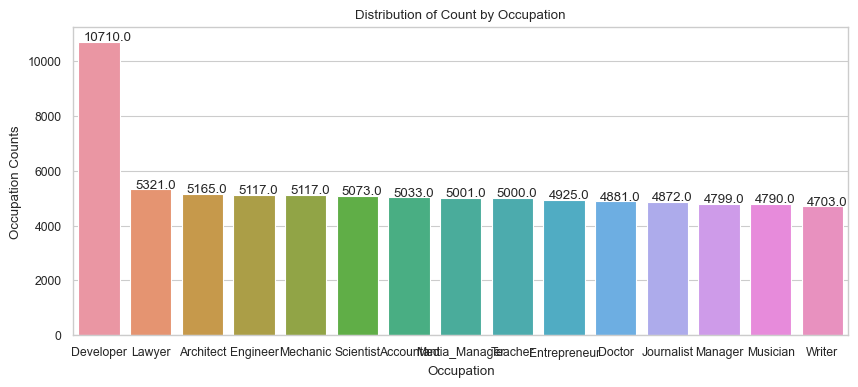

In [238]:
#Occupation
plt.figure(figsize=(10,4))
ax = sns.countplot(x = 'occupation',data=df_cat,order = df['occupation'].value_counts().index)
plt.title('Distribution of Count by Occupation')
plt.xlabel('Occupation')
plt.ylabel('Occupation Counts')
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()),(p.get_x()+0.1,p.get_height()+50))

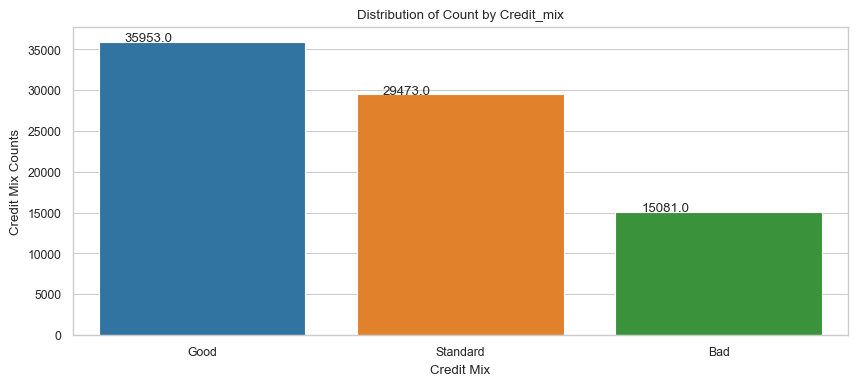

In [239]:
#Credit_mix
plt.figure(figsize=(10,4))
ax = sns.countplot(x = 'credit_mix',data=df_cat,order = df['credit_mix'].value_counts().index)
plt.title('Distribution of Count by Credit_mix')
plt.xlabel('Credit Mix')
plt.ylabel('Credit Mix Counts')
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()),(p.get_x()+0.1,p.get_height()+50))

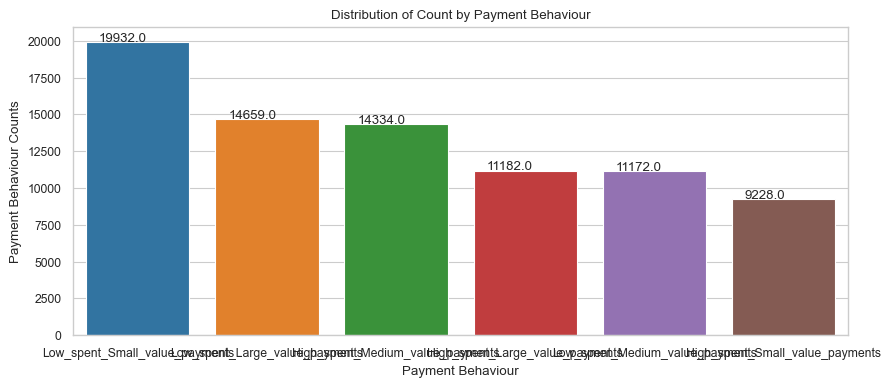

In [240]:
#Payment_behaviour
plt.figure(figsize=(10,4))
ax = sns.countplot(x = 'payment_behaviour',data=df_cat,order = df['payment_behaviour'].value_counts().index)
plt.title('Distribution of Count by Payment Behaviour')
plt.xlabel('Payment Behaviour')
plt.ylabel('Payment Behaviour Counts')
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()),(p.get_x()+0.1,p.get_height()+50))

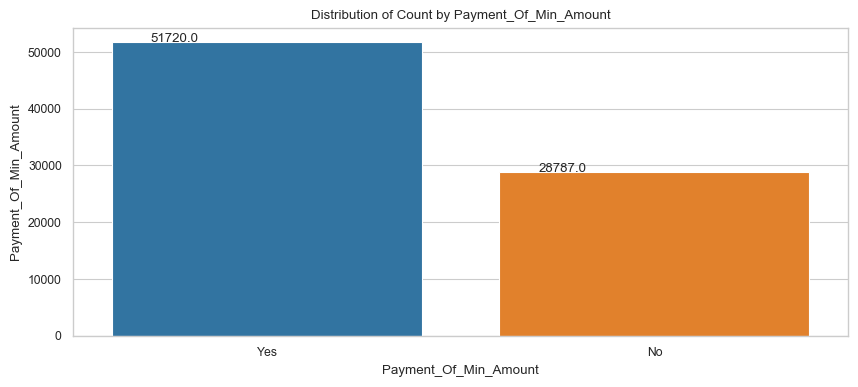

In [241]:
#Payment_Of_Min_Amount
plt.figure(figsize=(10,4))
ax = sns.countplot(x = 'payment_of_min_amount',data=df_cat,order = df['payment_of_min_amount'].value_counts().index)
plt.title('Distribution of Count by Payment_Of_Min_Amount')
plt.xlabel('Payment_Of_Min_Amount')
plt.ylabel('Payment_Of_Min_Amount')
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()),(p.get_x()+0.1,p.get_height()+50))

<Axes: xlabel='occupation', ylabel='count'>

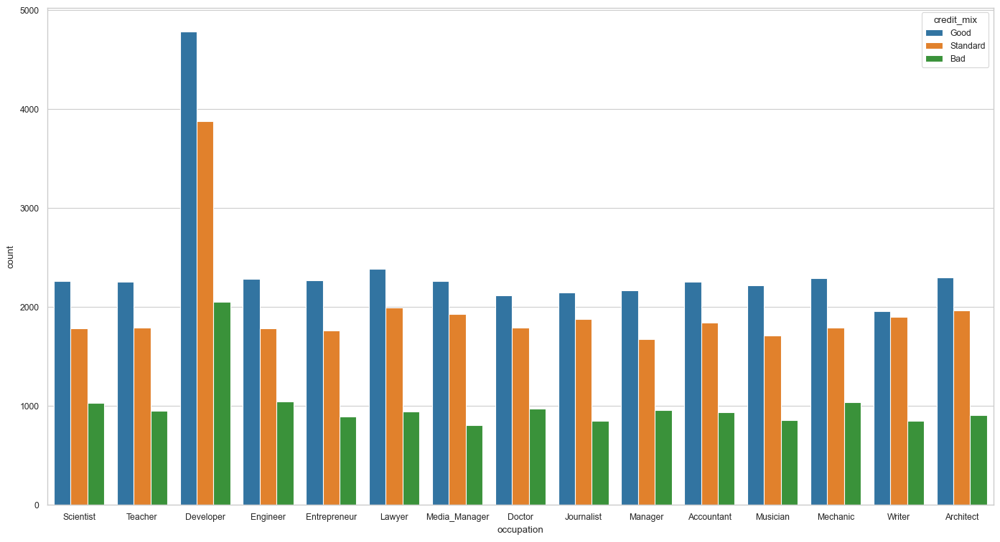

In [242]:
fig = plt.figure(figsize=(17,9))
sns.countplot(data=df_cat,x='occupation', hue='credit_mix')

### Numerical Data

In [243]:
df_num.describe()

,age,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,total_emi_per_month,amount_invested_monthly,monthly_balance
count,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00,80507.00
mean,111.37,176501.86,3986.06,17.27,22.81,73.79,2.88,21.02,29.79,10.45,27.17,1422.62,32.31,1385.16,607.38,402.27
std,691.87,1431016.59,2940.09,118.22,130.21,471.93,63.65,14.85,217.59,6.64,190.23,1152.21,5.11,8243.18,1999.88,213.23
min,-500.00,7005.93,303.65,-1.00,0.00,1.00,-100.00,-5.00,-3.00,0.00,0.00,0.23,20.88,0.00,0.00,0.01
25%,24.00,19296.42,1773.36,3.00,4.00,8.00,1.00,10.00,9.00,5.36,3.00,566.77,28.08,30.09,76.28,270.22
50%,33.00,36943.76,3058.20,6.00,5.00,13.00,3.00,18.00,14.00,9.41,6.00,1163.48,32.34,68.24,133.87,336.65
75%,42.00,72079.52,5310.87,7.00,7.00,20.00,5.00,28.00,18.00,14.78,9.00,1941.60,36.51,156.24,247.71,470.07
max,8698.00,24198062.00,15204.63,1798.00,1499.00,5797.00,1495.00,67.00,4397.00,36.97,2597.00,4998.07,50.00,82256.00,10000.00,1602.04


array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'annual_income'}>,
        <Axes: title={'center': 'monthly_inhand_salary'}>,
        <Axes: title={'center': 'num_bank_accounts'}>],
       [<Axes: title={'center': 'num_credit_card'}>,
        <Axes: title={'center': 'interest_rate'}>,
        <Axes: title={'center': 'num_of_loan'}>,
        <Axes: title={'center': 'delay_from_due_date'}>],
       [<Axes: title={'center': 'num_of_delayed_payment'}>,
        <Axes: title={'center': 'changed_credit_limit'}>,
        <Axes: title={'center': 'num_credit_inquiries'}>,
        <Axes: title={'center': 'outstanding_debt'}>],
       [<Axes: title={'center': 'credit_utilization_ratio'}>,
        <Axes: title={'center': 'total_emi_per_month'}>,
        <Axes: title={'center': 'amount_invested_monthly'}>,
        <Axes: title={'center': 'monthly_balance'}>]], dtype=object)

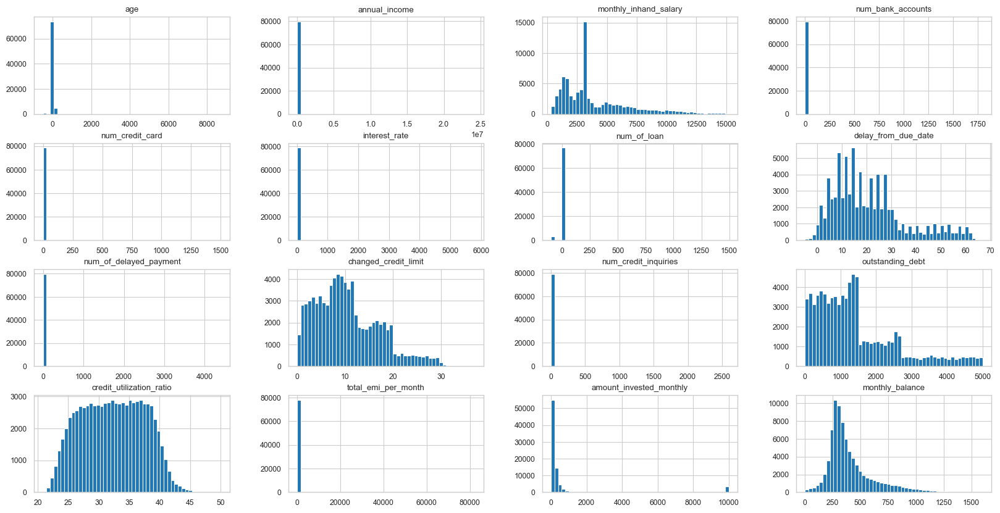

In [244]:
df_num.hist(bins=50,figsize=[20,10])

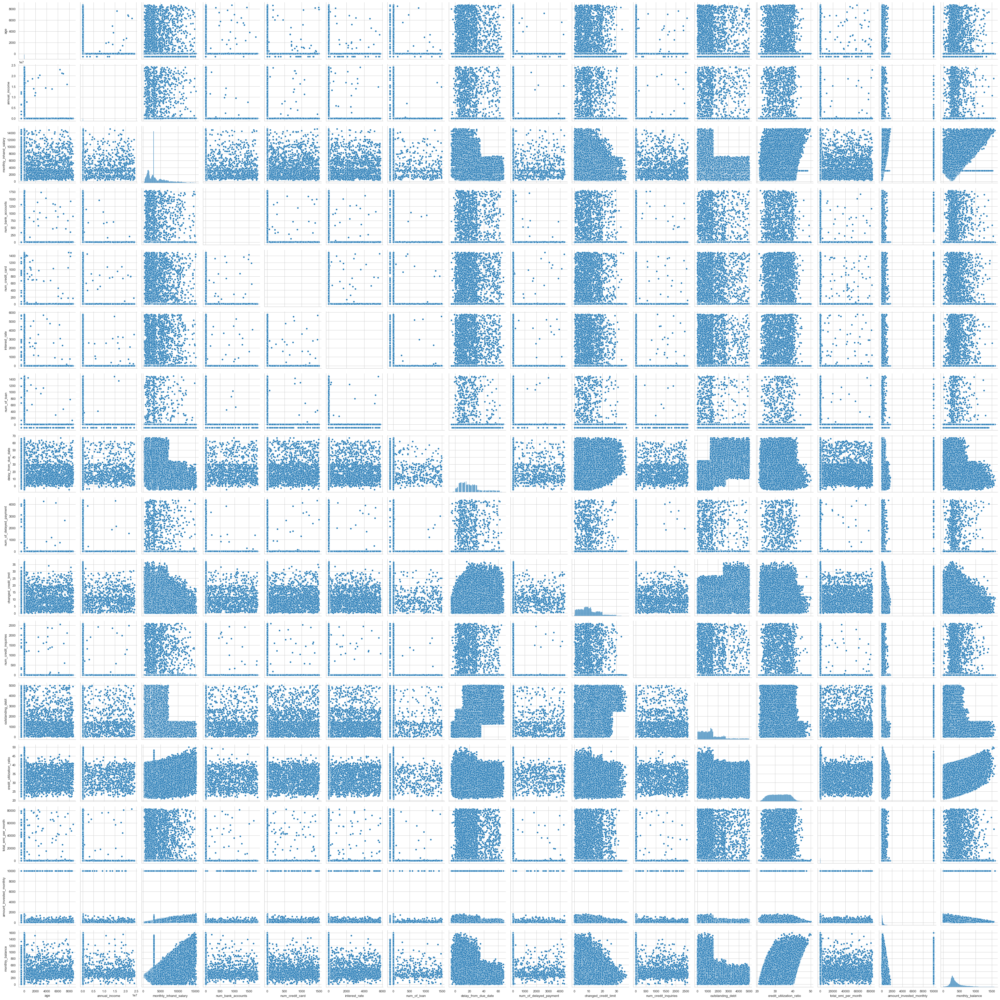

In [245]:
sns.pairplot(df_num)

In [246]:
corrmat = df_num.corr()
corrmat

,age,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,total_emi_per_month,amount_invested_monthly,monthly_balance
age,1.00,0.00,0.00,0.00,-0.00,-0.01,0.00,-0.01,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.01
annual_income,0.00,1.00,0.03,-0.01,-0.00,-0.00,0.00,-0.01,-0.00,-0.00,0.00,-0.00,0.01,-0.00,-0.01,0.02
monthly_inhand_salary,0.00,0.03,1.00,-0.01,-0.00,-0.00,-0.01,-0.23,0.00,-0.16,-0.01,-0.25,0.16,0.01,0.05,0.64
num_bank_accounts,0.00,-0.01,-0.01,1.00,-0.00,-0.00,-0.00,0.02,-0.00,0.01,-0.00,0.02,-0.00,-0.00,0.00,-0.01
num_credit_card,-0.00,-0.00,-0.00,-0.00,1.00,-0.01,0.00,0.01,0.01,0.00,-0.00,0.01,-0.00,0.00,-0.00,-0.01
interest_rate,-0.01,-0.00,-0.00,-0.00,-0.01,1.00,0.00,0.01,0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.01
num_of_loan,0.00,0.00,-0.01,-0.00,0.00,0.00,1.00,0.01,0.01,0.02,0.00,0.02,-0.00,0.00,-0.00,-0.02
delay_from_due_date,-0.01,-0.01,-0.23,0.02,0.01,0.01,0.01,1.00,0.01,0.29,0.01,0.57,-0.06,-0.00,-0.01,-0.28
num_of_delayed_payment,-0.00,-0.00,0.00,-0.00,0.01,0.00,0.01,0.01,1.00,0.01,0.00,0.01,-0.00,0.00,0.00,-0.00
changed_credit_limit,-0.00,-0.00,-0.16,0.01,0.00,0.00,0.02,0.29,0.01,1.00,0.01,0.46,-0.05,-0.00,-0.02,-0.20


In [247]:
numeric_cols = df.select_dtypes(exclude='object').columns

# Handle missing values (Example: fill with mean of the column)
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

# Check for duplicated columns
duplicated_columns = df.columns[df.columns.duplicated()].tolist()
print("Duplicated columns:", duplicated_columns)

# Drop duplicated columns if any
df = df.loc[:, ~df.columns.duplicated()]

# Check the correlation matrix
corr_matrix = df[numeric_cols].corr()
print(corr_matrix)

# Identify highly correlated features (with correlation > 0.9 for instance)
high_corr_var = np.where(np.abs(corr_matrix) > 0.9)
high_corr_var = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

print("Highly correlated features:", high_corr_var)

# Remove one of each pair of highly correlated features
for x, y in high_corr_var:
    if x in df.columns:
        df = df.drop(columns=[x])
    else:
        df = df.drop(columns=[y])

Duplicated columns: []
                           age  annual_income  monthly_inhand_salary  \
age                       1.00           0.00                   0.00   
annual_income             0.00           1.00                   0.03   
monthly_inhand_salary     0.00           0.03                   1.00   
num_bank_accounts         0.00          -0.01                  -0.01   
num_credit_card          -0.00          -0.00                  -0.00   
interest_rate            -0.01          -0.00                  -0.00   
num_of_loan               0.00           0.00                  -0.01   
delay_from_due_date      -0.01          -0.01                  -0.23   
num_of_delayed_payment   -0.00          -0.00                   0.00   
changed_credit_limit     -0.00          -0.00                  -0.16   
num_credit_inquiries     -0.00           0.00                  -0.01   
outstanding_debt         -0.00          -0.00                  -0.25   
credit_utilization_ratio  0.00           

<Axes: >

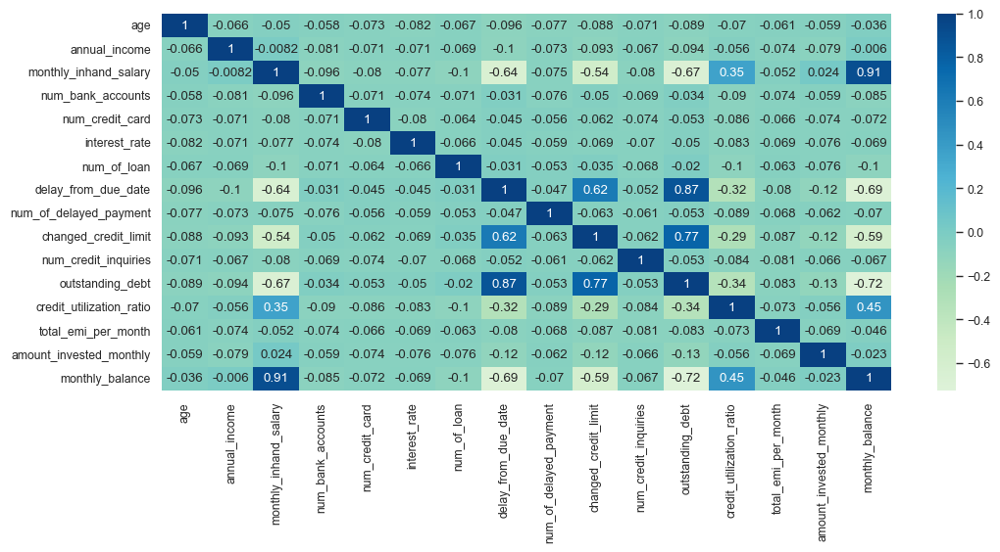

In [248]:
plt.figure(figsize = (12,5))
sns.heatmap(corrmat.corr(), cmap='GnBu', center=0 , annot = True)

In [249]:
# Correcting the typo in the method name
numeric_cols = df.select_dtypes(exclude='object').columns
cat_cols = df.select_dtypes(include='object').columns

In [250]:
print("Numeric columns:", numeric_cols)

Numeric columns: Index(['age', 'annual_income', 'monthly_inhand_salary', 'num_bank_accounts',
       'num_credit_card', 'interest_rate', 'num_of_loan',
       'delay_from_due_date', 'num_of_delayed_payment', 'changed_credit_limit',
       'num_credit_inquiries', 'outstanding_debt', 'credit_utilization_ratio',
       'total_emi_per_month', 'amount_invested_monthly', 'monthly_balance'],
      dtype='object')


In [251]:
print("Categorical columns:", cat_cols)

Categorical columns: Index(['occupation', 'credit_mix', 'payment_of_min_amount',
       'payment_behaviour', 'credit_score'],
      dtype='object')


In [252]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_df = df[numeric_cols]

vif_data = pd.DataFrame()
vif_data['feature'] = vif_df.columns
vif_data['VIF'] = [variance_inflation_factor(vif_df.values ,i) for i in range(len(vif_df.columns)) ]
vif_data.head(20)

,feature,VIF
0,age,1.03
1,annual_income,1.02
2,monthly_inhand_salary,4.85
3,num_bank_accounts,1.02
4,num_credit_card,1.03
5,interest_rate,1.02
6,num_of_loan,1.00
7,delay_from_due_date,4.43
8,num_of_delayed_payment,1.02
9,changed_credit_limit,4.29


In [256]:
df = df.drop(['monthly_inhand_salary', 'changed_credit_limit', 'outstanding_debt', 'credit_utilization_ratio', 'monthly_balance'], axis=1)

In [257]:
df

,age,occupation,annual_income,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,credit_score
0,23.00,Scientist,19114.12,3,4,3,4.00,3,7.00,4.00,Good,No,49.57,80.42,High_spent_Small_value_payments,Good
1,23.00,Scientist,19114.12,3,4,3,4.00,-1,14.00,4.00,Good,No,49.57,118.28,Low_spent_Large_value_payments,Good
3,23.00,Scientist,19114.12,3,4,3,4.00,5,4.00,4.00,Good,No,49.57,199.46,Low_spent_Small_value_payments,Good
4,23.00,Scientist,19114.12,3,4,3,4.00,6,14.00,4.00,Good,No,49.57,41.42,High_spent_Medium_value_payments,Good
5,23.00,Scientist,19114.12,3,4,3,4.00,8,4.00,4.00,Good,No,49.57,62.43,Low_spent_Large_value_payments,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25.00,Mechanic,39628.99,4,6,7,2.00,20,6.00,3.00,Good,No,35.10,140.58,High_spent_Medium_value_payments,Poor
99995,25.00,Mechanic,39628.99,4,6,7,2.00,23,7.00,3.00,Good,No,35.10,60.97,High_spent_Large_value_payments,Poor
99996,25.00,Mechanic,39628.99,4,6,7,2.00,18,7.00,3.00,Good,No,35.10,54.19,High_spent_Medium_value_payments,Poor
99997,25.00,Mechanic,39628.99,4,6,5729,2.00,27,6.00,3.00,Good,No,35.10,24.03,High_spent_Large_value_payments,Poor


### Random Forest Classifier

Accuracy: 0.76
Precision: 0.76
Recall: 0.76
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.68      0.70      2841
           1       0.75      0.78      0.76      4668
           2       0.79      0.78      0.78      8593

    accuracy                           0.76     16102
   macro avg       0.75      0.75      0.75     16102
weighted avg       0.76      0.76      0.76     16102



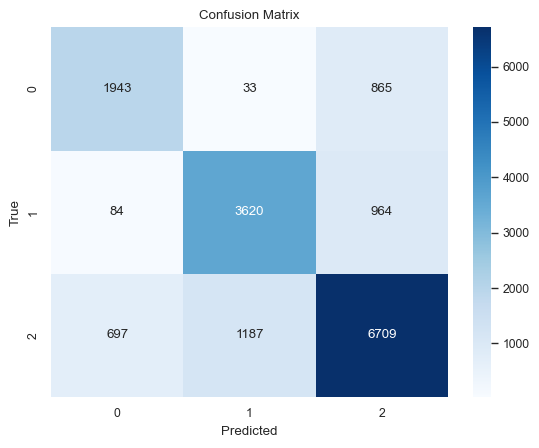

In [263]:
# this is the highst Algorithm where the accurcy == 77% 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier


# Assume df is the DataFrame you have preprocessed

# Encode categorical variables
le = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = le.fit_transform(df[column])

# Define the features (X) and the target (y)
X = df.drop(columns=['credit_score'])  # Replace 'credit_score' with the actual target column name
y = df['credit_score']  # Replace 'credit_score' with the actual target column name

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Predict on the test set
y_pred = rf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print('Classification Report:')
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


### LSTM



Epoch 1/50


1610/1610 [==============================] - 17s 7ms/step - loss: 0.9130 - accuracy: 0.5547 - val_loss: 0.8717 - val_accuracy: 0.5673
Epoch 2/50
1610/1610 [==============================] - 10s 6ms/step - loss: 0.8824 - accuracy: 0.5708 - val_loss: 0.8630 - val_accuracy: 0.5832
Epoch 3/50
1610/1610 [==============================] - 10s 7ms/step - loss: 0.8733 - accuracy: 0.5767 - val_loss: 0.8541 - val_accuracy: 0.5870
Epoch 4/50
1610/1610 [==============================] - 10s 6ms/step - loss: 0.8659 - accuracy: 0.5813 - val_loss: 0.8516 - val_accuracy: 0.5887
Epoch 5/50
1610/1610 [==============================] - 11s 7ms/step - loss: 0.8614 - accuracy: 0.5847 - val_loss: 0.8510 - val_accuracy: 0.5871
Epoch 6/50
1610/1610 [==============================] - 11s 7ms/step - loss: 0.8546 - accuracy: 0.5885 - val_loss: 0.8487 - val_accuracy: 0.5918
Epoch 7/50
1610/1610 [==============================] - 10s 6ms/step - loss: 0.8486 - accuracy: 0.5933 - val_loss: 0.8427 - va

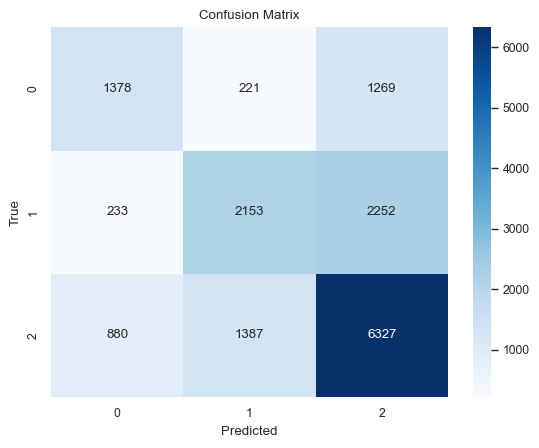

In [265]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical

# Assume df is the DataFrame you have preprocessed

# Encode categorical variables
le = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = le.fit_transform(df[column])

# Define the features (X) and the target (y)
X = df.drop(columns=['credit_score'])  # Replace 'credit_score' with the actual target column name
y = df['credit_score']  # Replace 'credit_score' with the actual target column name

# Reset the index of y to align with X
y = y.reset_index(drop=True)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Transform the data into sequences
def create_sequences(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 10
X_seq, y_seq = create_sequences(X_scaled, y, time_steps)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)

# Convert the target variable to categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(time_steps, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(units=y_train.shape[1], activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate the model
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)
y_test_class = np.argmax(y_test, axis=1)

accuracy = accuracy_score(y_test_class, y_pred)
precision = precision_score(y_test_class, y_pred, average='weighted')
recall = recall_score(y_test_class, y_pred, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print('Classification Report:')
print(classification_report(y_test_class, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_class, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


### LogisticRegression

Accuracy: 0.60
Precision: 0.60
Recall: 0.60
Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.42      0.46      2841
           1       0.61      0.43      0.50      4668
           2       0.62      0.75      0.68      8593

    accuracy                           0.60     16102
   macro avg       0.58      0.53      0.55     16102
weighted avg       0.60      0.60      0.59     16102



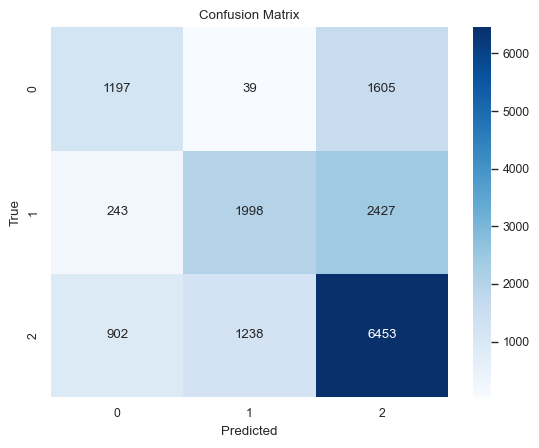

In [267]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

# Assume df is the DataFrame you have preprocessed

# Encode categorical variables
le = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = le.fit_transform(df[column])

# Define the features (X) and the target (y)
X = df.drop(columns=['credit_score'])  # Replace 'credit_score' with the actual target column name
y = df['credit_score']  # Replace 'credit_score' with the actual target column name

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the Logistic Regression model
model = LogisticRegression(max_iter=1000, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print('Classification Report:')
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


### Gradient Boosting Classifier

Accuracy: 0.67
Precision: 0.68
Recall: 0.67
Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.58      0.58      2841
           1       0.65      0.70      0.67      4668
           2       0.72      0.69      0.71      8593

    accuracy                           0.67     16102
   macro avg       0.65      0.66      0.65     16102
weighted avg       0.68      0.67      0.67     16102



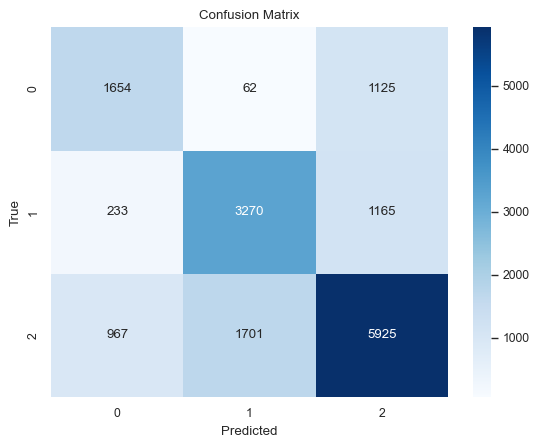

In [268]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier

# Assume df is the DataFrame you have preprocessed

# Encode categorical variables
le = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = le.fit_transform(df[column])

# Define the features (X) and the target (y)
X = df.drop(columns=['credit_score'])  # Replace 'credit_score' with the actual target column name
y = df['credit_score']  # Replace 'credit_score' with the actual target column name

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the Gradient Boosting model
model = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print('Classification Report:')
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()
